In [1]:
import pandas as pd
import numpy as np
df= pd.read_csv(r"Crime_Data_from_2020_to_Present.csv")

In [2]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


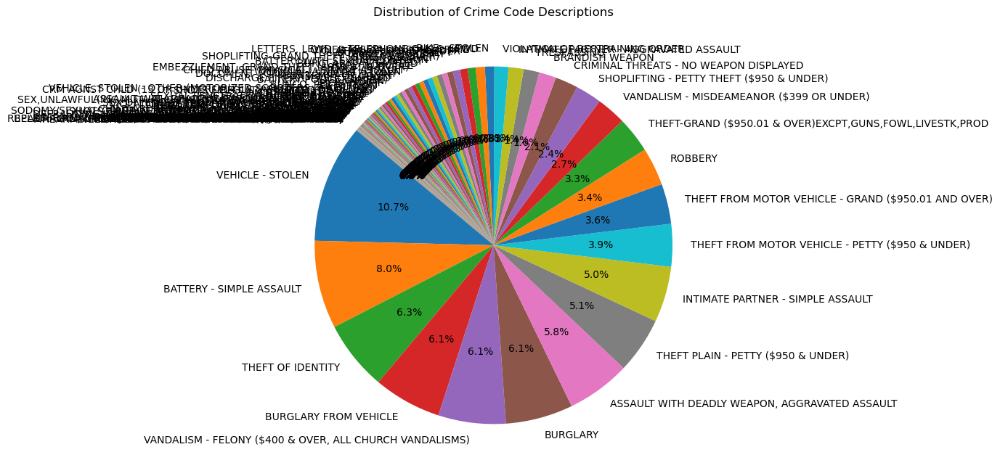

In [3]:
import matplotlib.pyplot as plt

def plot_pie_chart(data, column_name, title):
    # Count the occurrences of each category in the column
    counts = data[column_name].value_counts()

    # Plot pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.show()

# Plot pie chart for 'Crm Cd Desc'
plot_pie_chart(df, 'Crm Cd Desc', 'Distribution of Crime Code Descriptions')


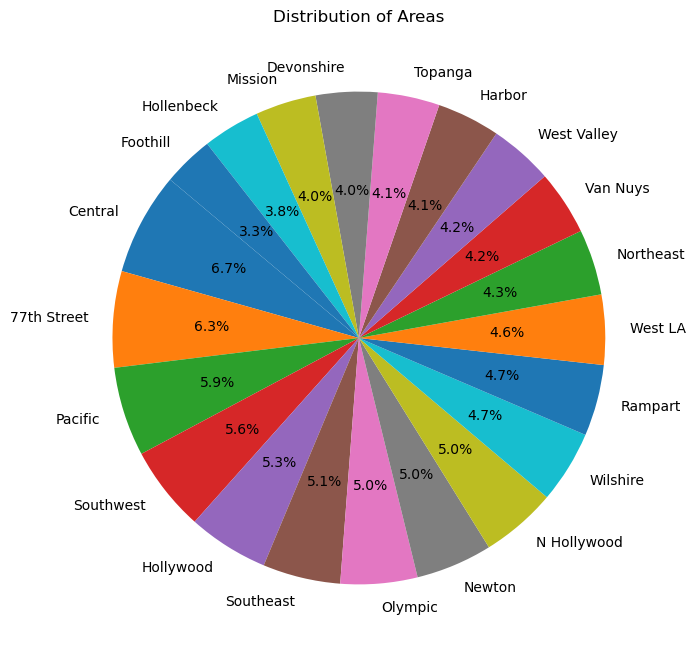

In [4]:

# Plot pie chart for 'Area'
plot_pie_chart(df, 'AREA NAME', 'Distribution of Areas')

In [5]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Filter out rows where LAT or LON is NaN
df = df.dropna(subset=['LAT', 'LON'])

# Create a map centered around Los Angeles
map = folium.Map(location=[34.05, -118.25], zoom_start=10)

# Create a heat map layer
heat_map = HeatMap(list(zip(df.LAT.values, df.LON.values)),
                   min_opacity=0.2,
                   radius=15, blur=15,
                   max_zoom=1)

# Add the heat map layer to the map
map.add_child(heat_map)

# Save to an HTML file
map.save('LA_HeatMap.html')

# Display the map in Jupyter Notebook (if you're using it)
map


/var/folders/lc/7q7180414lzbsm27dnbt0sxr0000gn/T/ipykernel_73796/2730045332.py:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])


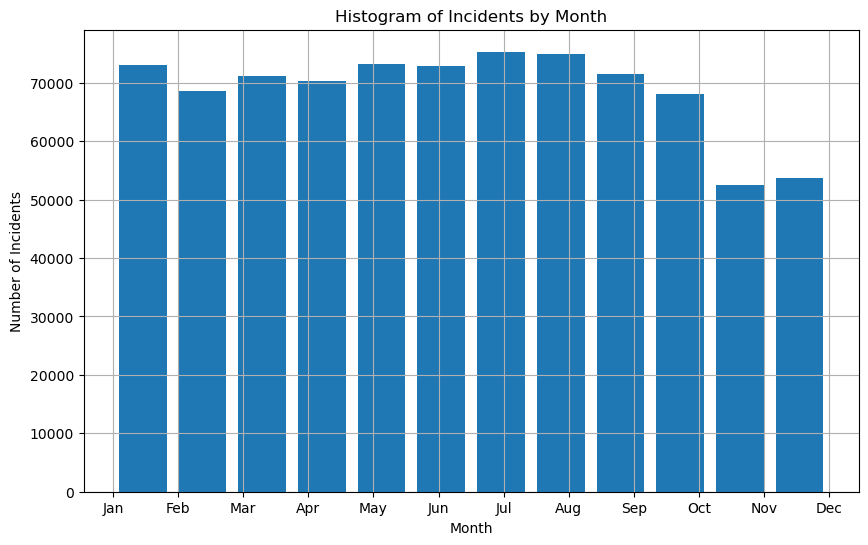

In [6]:
from datetime import datetime


# Convert 'DATE OCC' to datetime
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])

# Extract the month
df['Month'] = df['DATE OCC'].dt.month

# Plotting the histogram
plt.figure(figsize=(10, 6))
df['Month'].hist(bins=12, rwidth=0.8, range=(1, 12))
plt.title('Histogram of Incidents by Month')
plt.xlabel('Month')
plt.ylabel('Number of Incidents')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

/var/folders/lc/7q7180414lzbsm27dnbt0sxr0000gn/T/ipykernel_73796/1468202958.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])


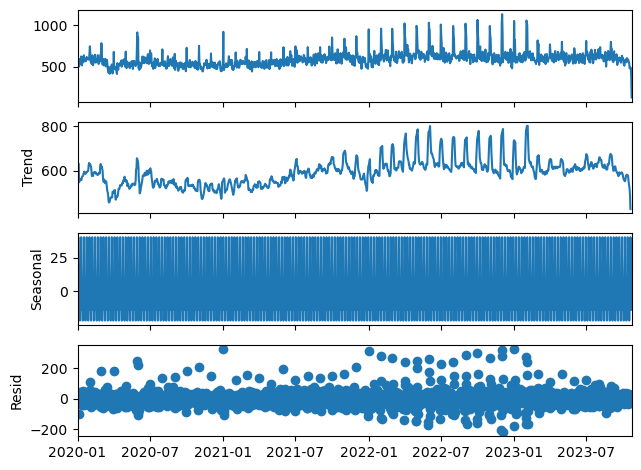

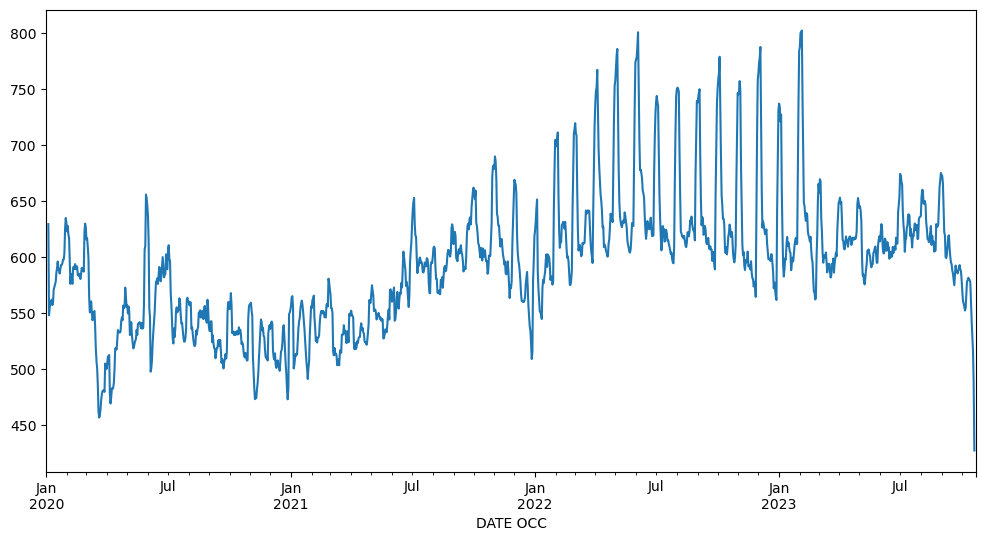

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Load the data
# Assuming the data is in a CSV file named 'crime_data.csv'
df = pd.read_csv('/Users/saimouryab/Downloads/Crime_Data_from_2020_to_Present.csv')

# Convert 'DATE OCC' to datetime format
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])

# Set the 'DATE OCC' as the index
df.set_index('DATE OCC', inplace=True)

# Resample the data to get a count of crimes per day
daily_crime_counts = df.resample('D').size()

# Perform a seasonal decomposition
decomposition = seasonal_decompose(daily_crime_counts, model='additive')

# Plot the decomposed time series components
decomposition.plot()
plt.show()

# To further analysis, you may want to investigate the trend component or the seasonal component
# For example, here's how to plot just the trend
trend = decomposition.trend
trend.plot(figsize=(12, 6))
plt.show()

# You can also perform additional statistical tests, such as checking for stationarity,
# or model the time series using ARIMA, SARIMA, or other suitable models.


In [23]:
past_df = pd.read_csv("/Users/saimouryab/Downloads/Crime_Data_from_2010_to_2019.csv")
combined_df = pd.concat([df, past_df])
past_df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,1307355,02/20/2010 12:00:00 AM,02/20/2010 12:00:00 AM,1350,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,...,AA,Adult Arrest,900.0,NaN,NaN,NaN,300 E GAGE AV,NaN,33.9825,-118.2695
1,11401303,09/13/2010 12:00:00 AM,09/12/2010 12:00:00 AM,45,14,Pacific,1485,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962
2,70309629,08/09/2010 12:00:00 AM,08/09/2010 12:00:00 AM,1515,13,Newton,1324,2,946,OTHER MISCELLANEOUS CRIME,...,IC,Invest Cont,946.0,NaN,NaN,NaN,1300 E 21ST ST,NaN,34.0224,-118.2524
3,90631215,01/05/2010 12:00:00 AM,01/05/2010 12:00:00 AM,150,6,Hollywood,646,2,900,VIOLATION OF COURT ORDER,...,IC,Invest Cont,900.0,998.0,NaN,NaN,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295
4,100100501,01/03/2010 12:00:00 AM,01/02/2010 12:00:00 AM,2100,1,Central,176,1,122,"RAPE, ATTEMPTED",...,IC,Invest Cont,122.0,NaN,NaN,NaN,8TH ST,SAN PEDRO ST,34.0387,-118.2488


In [16]:
combined_df.head()

,DR_NO,Date Rptd,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,...,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,AREA
DATE OCC,,,,,,,,,,,,,,,,,,,,,
NaT,10304468,01/08/2020 12:00:00 AM,2230,3.0,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,...,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978,NaN
NaT,190101086,01/02/2020 12:00:00 AM,330,1.0,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,...,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545,NaN
NaT,200110444,04/14/2020 12:00:00 AM,1200,1.0,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,...,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474,NaN
NaT,191501505,01/01/2020 12:00:00 AM,1730,15.0,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,...,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019,NaN
NaT,191921269,01/01/2020 12:00:00 AM,415,19.0,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,...,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468,NaN
